# Table of Contents
* [Introduction](#Introduction)
* [Approach](#Approach)
* [Functions](#Functions)
* [Analyses](#Analyses)
    * [G. aculeatus](#G.aculeatus)
        * [X chromosome (Chr19)](#Ga_Xchrom)
            * [Coverage](#GaX_Coverage)
            * [Heterozygosity](#GaX_Heterozygosity)
            * [Coverage vs. Heterozygosity](#GaX_Cov_vs_Het)
                * [Histograms](#GaX_Cov_vs_Het_histograms)
                * [Scatter](#GaX_Cov_vs_Het_Scatter)
            * [Isolating 2n bins](#GaX_2n_Bins)
                * [Loose thresholds bin positions](#GaX_2n_Bins_loose_thresh)
                    * [Outputting loose threshold bins](#GaX_2n_Bins_loose_out)
                * [Strict thresholds bin positions](#GaX_2n_Bins_strict_thresh)
                    * [Outputting strict threshold bins](#GaX_2n_Bins_strict_out)
     * [G. wheatlandi](#G.wheatlandi)
         * [Chromosome X19](#GwX19)
             * [Coverage](#GwX19_coverage)
             * [Heterozygosity](#GwX19_Heterozygosity)
             * [Coverage vs. Heterozygosity](#GwX19_Cov_vs_Het)
                * [Histograms](#GwX19_Cov_vs_Het_histograms)
                * [Scatter](#GwX19_Cov_vs_Het_Scatter)
             * [Isolating 2n bins](#GwX19_2n_Bins)
                * [Putatively 2n bin positions](#GwX19_2n_Bins)
                    * [Outputting 2n bins](#GwX19_2n_bins_out)
         * [Chromosome X12](#GwX12)
             * [Coverage vs. Heterozygosity](#GwX12_Cov_vs_Het)
                * [Histograms](#GwX12_Cov_vs_Het_histograms)
                * [Scatter](#GwX12_Cov_vs_Het_Scatter)
             * [Isolating 2n bins](#GwX12_2n_Bins)
                * [Putatively 2n bin positions](#GwX12_2n_Bins)
                    * [Outputting 2n bins](#GwX12_2n_Bins_loose_out)
* [EXTRA](#EXTRA)
    * [G. aculeatus ChrXIX analyses with Het probabilities](#Ga_chr19_het_probs)
    * [Chr11 inversion](#Ga_chr11_inversion)

                    
                    
                    
                    
                    
                    


# Introduction

**Finding diploid and haploid regions on stickleback sex chromosomes**

To distinguish between diploid vs hemizygous regions of the sex chromosomes in threespine and blackspotted, here we plot read depth and heterozygosity from males and females. 

**Samples**

***G. aculeatus***:  
- Males: 50
- Females: 50
(samples from a mix of all source populations)

**Data processing**
- Trimmed fasqs were aligned (bwa-mem) against 2 reference versions for each species. One containing Autosomes and X only, and the other containing Autosomes and Y only. 

- Depths were calculated from filtered bam filtes using DeepTools, with RPKM normalisation.

- Samples were sexed with /UTILs/Sexer.py based on coverage ratio of Chr19 vs autotosomes.

- SNPs were called within and among samples using GATK4

- Heterozygosity was caluculated from filtered SNP calls using VCFtools (--hardy). 


# Approach

To find homologous (2n) X and Y specific (1n) regions I will use several metrics which should tell us whether a region is 1n or 2n in males and females. I am calculating these metrics for 2 sets of alignments:

1. Males and females against Autosome + ***X only*** reference
2. Males and females against Autosome + ***Y only*** reference

Thus, for each chromosome (X and Y) I have the below metrics for males and females. I list the expectations for each metric in each context below:

***For homologous regions shared by X and Y***

|          |  X males  |  X females  |  Y males  | Y females |
|----------|-----------|-------------|-----------|-----------|
|   Cov    |    2n     |      2n     |    2n     |    2n     |
|   Het    |   High    |  Autosomal  |   High    | Autosomal |

  


***For X specific regions (i.e. lost by the Y or gained by the X)***  

|          |  X males  |  X females  |  Y males  | Y females |
|----------|-----------|-------------|-----------|-----------|
|   Cov    |    1n     |      2n     |    n/a    |    n/a    |
|   Het    |   Zero    |  Autosomal  |    n/a    |    n/a    |

  


***For Y specific regions (i.e. lost by the X or gained by the Y)***  

|          |  X males  |  X females  |  Y males  | Y females |
|----------|-----------|-------------|-----------|-----------|
|   Cov    |    n/a    |     n/a     |    1n     |    Zero   |
|   Het    |    n/a    |     n/a     |    Zero   |    Zero   |


Ok, so these are some good predictions (i.e. should be obvious in the data). I can now go ahead and plot these stats for the 2 alignments (agains the X and against the Y) and see how the data look. 

I will plot in several forms. First, I will use scatter plots (and maybe histograms) to plot Males and females against oneanother for each stat. 

Second I will plot them on the genome. And may highlight subsets based on the scatter plots

# Functions

In [1]:
%%html
<style>
table {align:left; display:block}
</style>

In [21]:
import numpy as np
from matplotlib import pyplot as plt
    
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 14})

In [3]:
def Combine_depths(wd, suffix, window_size = 500, sex_info_dict = None):
    
    """
    Combine the outputs of DeepTools coverage outputs.
    
    wd      - directory containing all of the coverage files
    suffix  - suffix for all of the depth files. 
    
    """
    
    import os

    scaff_dict = {}

    samples = []

    for file in os.listdir(wd):

        if file.endswith(suffix):

            sample = file.split(".")[0]

            samples.append(sample)

            with open("%s/%s" % (wd, file)) as covs:

                for line in covs:

                    scaff = line.split()[0]
                    strt = int(line.split()[1])
                    stop = int(line.split()[2])
                    depth = line.split()[3]

                    if scaff not in scaff_dict:
                        scaff_dict[scaff] = {}


                    ## split annoyingly merged windows!!

                    if stop - strt != window_size:

                        ## numbr of bins merged
                        N_merged_bins = int((stop-strt)/window_size)
                        #print(sample, strt)
                        for i in range(1,N_merged_bins+1):

                            new_stop = strt+(i*window_size)

                            if i == 1:
                                new_strt = strt
                            else:
                                new_strt = strt+((i-1)*window_size)

                            window = "%s_%s" % (new_strt, new_stop)

                            if window not in scaff_dict[scaff]:
                                #print(sample, window)
                                scaff_dict[scaff][window] = []

                            scaff_dict[scaff][window].append(depth)

                    else:

                        window = "%s_%s" % (strt, stop)

                        if window not in scaff_dict[scaff]:
                            scaff_dict[scaff][window] = []

                        scaff_dict[scaff][window].append(depth)


            print("%s done!!" % sample)



    with open("%s/Combined_depths.out" % wd, 'w') as outfile:

        outfile.write("CHROM\tSTART\tSTOP\t%s\n" % "\t".join(samples))

        for scaff in sorted(scaff_dict.keys()):

            for window in sorted(scaff_dict[scaff].keys()):

                outfile.write("%s\t%s\t%s\t%s\n" % (scaff, window.split("_")[0], window.split("_")[1], "\t".join(scaff_dict[scaff][window])))

    print("\nDone, output here: %s/Combined_depths.out\n" % wd)
    return(scaff_dict)

In [4]:
def M_vs_F_cov(infilepath, 
               outfilename, 
               males = None, 
               females = None, 
               min_cov = 0,
               max_cov = 20):
    
    
    """
    Function to calculate male vs female coverage from DeepTools outputs
    
    infilepath         - Full input file path
    outfilename        - Name of file to output coverage ratios (will be in same path as input)
    males              - Python list of male names exactly as they appear in the input file
    females            - Python list of female names exactly as they appear in the input file
    min_samples        - Min number of samples with >0 coverage at each window (of either sex)
    min_mean_depth     - Min average depth at a window that must be present in at least 1 sex
    
    """
    
    import numpy as np

    outpath = "%s/%s" % (infilepath.rpartition("/")[0], outfilename)
    
    outhandle = open(outpath, 'w')

    outhandle.write("CHROM\tSTART\tSTOP\tCENTRE\tMALE_DEPTH\tFEMALE_DEPTH\tM/F_Depth\n")
    
    outdict = {}
    
    
    ### Check sex information
    
    if any([males == None, females == None]):
        sys.exit("Sex information not supplied!)")
    

    ## gather coverage information . . . 
    
    male_covs = []
    female_covs = []
    
    with open(infilepath) as allcovs:

        samples = next(allcovs).split()[3:]  ## get sample names from header line

        index = 0
        male_indices = []  ## get column numbers for males in the columns
        female_indices = []  ## get column numbers for females
        
        for sample in samples:

            if sample in males:
                male_indices.append(index)

            elif sample in females:
                female_indices.append(index)

            index += 1
        
        print("Males found", len(male_indices))
        print("Females found", len(female_indices))
        
        ## Data lines below
        
        filtered = []
        
        for line in allcovs:  ## each line is a window

            scaff = line.split()[0]
            strt = int(line.split()[1])
            stop = int(line.split()[2])

            centre = strt+((stop-strt)/2)
            window = "%s_%s" % (strt, stop)

            data = line.split()[3:]  ## this is the coverage data across all samples for the given window 

            data_index = 0
            male_data = []
            female_data = []

            for depth in data: ## store the male / female data for the window
                
                if data_index in male_indices:
                    male_data.append(float(depth))

                elif data_index in female_indices:
                    female_data.append(float(depth))                    

                data_index += 1
                        
            mean_window_depth_male = np.mean(male_data)
            mean_window_depth_female = np.mean(female_data)
            
            male_covs.append(mean_window_depth_male)
            female_covs.append(mean_window_depth_female)
            
            ## Deal with windows where one sex has 0 depth
            
            if any([mean_window_depth_male == 0,
                    mean_window_depth_female == 0]):
                
                mean_window_depth_male = np.nan
                mean_window_depth_female = np.nan
                ratio = np.nan
                filtered.append("%s_%s_%s" % (scaff, strt, stop))
                
            ## remove windows that don't meet filtering requirements. . . . 
            
            elif any([mean_window_depth_male < min_cov,
                    mean_window_depth_female < min_cov]):

                mean_window_depth_male = np.nan
                mean_window_depth_female = np.nan
                ratio = np.nan
                filtered.append("%s_%s_%s" % (scaff, strt, stop))
                
            elif any([mean_window_depth_male > max_cov,
                    mean_window_depth_female > max_cov]):
                
                mean_window_depth_male = np.nan
                mean_window_depth_female = np.nan
                ratio = np.nan
                filtered.append("%s_%s_%s" % (scaff, strt, stop))
                
            else:
                ratio = np.round(mean_window_depth_male/mean_window_depth_female,2)
                
            
            if scaff not in outdict:
                
                outdict[scaff] = {}
                
            outdict[scaff][strt] = "\t".join([scaff, ## chromosome
                                              str(strt), ## start
                                              str(stop),  ## stop
                                              str(centre),  ## centre
                                              str(np.round(mean_window_depth_male,3)), ## average male depth for window 
                                              str(np.round(mean_window_depth_female,3)),  ## average female depth for window
                                              str(ratio)])  ## ratio of average male / average female depth per window
        
        
        for scaff in sorted(outdict.keys()):
            
            for pos in sorted(outdict[scaff].keys()):
            
                outhandle.write("%s\n" % outdict[scaff][pos])
    
    
    outhandle.close()
    
    print("filtered %s windows" % len(filtered))
    
    return male_covs, female_covs
    
    

Ok, I want to combine the M_vs_F_cov functions into a single function that outputs separated male and female coverage, and the ratio, and the rolling average for each window....

In [5]:
def Plot_M_F_cov(infilepath, outfilepath = None, scaffs = None, figlims = (20,5), 
                 plot_male = True, plot_female = True, plot_ratio = True,
                 roll = 10, moving_average_offset = 2500,
                 points_male = True, lines_male = True, fill_STD_male = False,
                 points_female = True, lines_female = True, fill_STD_female = False,
                 points_ratio = True, lines_ratio = True, fill_STD_ratio = False,
                 male_points_color = "blue", male_fill_color = "blue" , male_line_color = "darkblue",
                 female_points_color = "chocolate", female_fill_color = "chocolate", female_line_color = "saddlebrown",
                 ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                 male_points_alpha = 0.5, male_fill_alpha = 0.2 , male_line_alpha = 0.5,
                 female_points_alpha = 0.5, female_fill_alpha = 0.2, female_line_alpha = 0.5,
                 ratio_points_alpha = 0.5, ratio_fill_alpha = 0.2, ratio_line_alpha = 0.5,
                 male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                 myXlims = None, myYlims_ax1 = None, myYlims_ax2 = None, 
                 avg_window = None, features = None,
                 highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.7,
                 highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.7,
                 auto_average_male = None, auto_average_male_color = "green", auto_average_male_alpha = 0.5, 
                 auto_average_female = None, auto_average_female_color = "green", auto_average_female_alpha = 0.5,
                 auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5, 
                 vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5):
    
    """
    Plots coverage data separately per sex, and as a ratio and writes output to a file
    
    """
    
    import sys
    import numpy as np
    import pandas as pd
    from matplotlib import pyplot as plt
    
    plt.rcParams["font.family"] = "Times New Roman"
    plt.rcParams.update({'font.size': 14})
    
    Scaff_dict = {}

    with open(infilepath) as cov_diffs:

        headers = next(cov_diffs)


        for line in cov_diffs:

            scaff = line.split()[0]
            pos = int(float(line.split()[3]))
            male_cov = float(line.split()[4])
            female_cov = float(line.split()[5])
            
            if line.split()[6] == "NA":
                diff = np.nan
            else:
                diff = float(line.split()[6])
                
            
            if scaff not in Scaff_dict:
                Scaff_dict[scaff] = {}
                Scaff_dict[scaff]["centre"] = []
                Scaff_dict[scaff]["ratio"] = []
                Scaff_dict[scaff]["male_cov"] = []
                Scaff_dict[scaff]["female_cov"] = []

            Scaff_dict[scaff]["centre"].append(pos)
            Scaff_dict[scaff]["ratio"].append(diff)
            Scaff_dict[scaff]["male_cov"].append(male_cov)
            Scaff_dict[scaff]["female_cov"].append(female_cov)

                
    output_DF = pd.DataFrame()
    
    if scaffs:
        scaffs_to_plot = scaffs
        
    else:
        scaffs_to_plot = sorted(Scaff_dict.keys())
        
    
    print("Plotting scaffolds: %s" % ", ".join(scaffs_to_plot))
  
    plt.figure(figsize = (figlims[0],figlims[1]*len(scaffs_to_plot)))
    
    scaff_index = 1
    
    for scaff in scaffs_to_plot:
    
        df = pd.DataFrame() ## initiate dataframe to catch outputs

        ax1 = plt.subplot(len(scaffs_to_plot),1,scaff_index) ## initiate plot object
        axis_2 = False  ## this is used later to track whether axis 2 has been made yet or not (it can be initiated at multiple steps)
        ax1.title.set_text(scaff)

        if plot_male == True:  ## plot male data    
            
            male_pddf = pd.DataFrame(Scaff_dict[scaff]["male_cov"], dtype='float64')
            rolling_mean_males = male_pddf.rolling(roll, min_periods=1).mean()
            rolling_STD_lower_males = rolling_mean_males - male_pddf.rolling(roll, min_periods=1).std()
            rolling_STD_upper_males = rolling_mean_males + male_pddf.rolling(roll, min_periods=1).std()

            if points_male == True:
                ax1.scatter([i/1000000 for i in Scaff_dict[scaff]["centre"]],
                            male_pddf, 
                            c = male_points_color, 
                            s = 5, 
                            alpha = male_points_alpha, 
                            zorder = male_zorder)

            if lines_male == True:
                ax1.plot([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                         rolling_mean_males, 
                         c = male_line_color, 
                         linewidth = 1, 
                         alpha = male_line_alpha,
                         zorder = male_zorder)
            
            if fill_STD_male == True: 
                ax1.fill_between([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                                 [i[0] for i in rolling_STD_lower_males.values], 
                                 [i[0] for i in rolling_STD_upper_males.values], 
                                 alpha = male_fill_alpha, 
                                 linewidth=0.0,
                                 color = male_fill_color,
                                 zorder = male_zorder)

            ## control axis limits
            
            if myXlims:
                min_x = myXlims[0]
                max_x = myXlims[1]
                ax1.set_xlim(min_x, max_x)
                
            if myYlims_ax1:
                min_y = myYlims_ax1[0]
                max_y = myYlims_ax1[1]
                ax1.set_ylim(min_y, max_y)
                
            ## Set axis labels
            
            if plot_female == True:
                ax1.set_ylabel("Male and Female coverage")
            else:
                ax1.set_ylabel("Male coverage")
            
            
            ## catch outputs
                
            df["Chromosomes"] = [scaff]*len(male_pddf)  ## this df will get made several times if more than one plot is requested, but makes no difference. 
            df["Window_centres"] = [(i)/1000000 for i in Scaff_dict[scaff]["centre"]]
            df["Male_coverage"] = male_pddf
            df["Rolling_mean_10kb_males"] = rolling_mean_males
            df["rolling_STD_lower_males"] = rolling_STD_lower_males
            df["rolling_STD_upper_males"] = rolling_STD_upper_males

        if plot_female == True:  ## plot female data
            
            female_pddf = pd.DataFrame(Scaff_dict[scaff]["female_cov"], dtype='float64')
            rolling_mean_females = female_pddf.rolling(roll, min_periods=1).mean()
            rolling_STD_lower_females = rolling_mean_females - female_pddf.rolling(roll, min_periods=1).std()
            rolling_STD_upper_females = rolling_mean_females + female_pddf.rolling(roll, min_periods=1).std()

            if points_female == True:
                ax1.scatter([i/1000000 for i in Scaff_dict[scaff]["centre"]],
                            female_pddf, 
                            c = female_points_color, 
                            s = 5, 
                            alpha = female_points_alpha, 
                            zorder = female_zorder)

            if lines_female == True:
                ax1.plot([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]],
                         rolling_mean_females, 
                         c = female_line_color, 
                         linewidth = 1, 
                         alpha = 0.5, 
                         zorder = female_zorder)

            if fill_STD_female == True: 
                ax1.fill_between([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                                 [i[0] for i in rolling_STD_lower_females.values], 
                                 [i[0] for i in rolling_STD_upper_females.values], 
                                 alpha = female_fill_alpha, 
                                 linewidth=0.0,
                                 color = female_fill_color,
                                 zorder = female_zorder)    
            
            ## control axis limits
            
            if myXlims:
                min_x = myXlims[0]
                max_x = myXlims[1]
                ax1.set_xlim(min_x, max_x)
                
            if myYlims_ax1:
                min_y = myYlims_ax1[0]
                max_y = myYlims_ax1[1]
                ax1.set_ylim(min_y, max_y)
            
            if plot_male == True:
                ax1.set_ylabel("Male and Female coverage")
            else:
                ax1.set_ylabel("Female coverage")
            
            
            ## catch outputs
            
            df["Chromosomes"] = [scaff]*len(female_pddf)
            df["Window_centres"] = [(i)/1000000 for i in Scaff_dict[scaff]["centre"]]
            df["Female_coverage"] = female_pddf
            df["Rolling_mean_10kb_females"] = rolling_mean_females
            df["rolling_STD_lower_females"] = rolling_STD_lower_females
            df["rolling_STD_upper_females"] = rolling_STD_upper_females
        
        
        if plot_ratio == True:
            
            ratio_pddf = pd.DataFrame(Scaff_dict[scaff]["ratio"], dtype='float64')
            rolling_mean_ratio = ratio_pddf.rolling(roll, min_periods=1).mean()
            rolling_STD_lower_ratio = rolling_mean_ratio - ratio_pddf.rolling(roll, min_periods=1).std()
            rolling_STD_upper_ratio = rolling_mean_ratio + ratio_pddf.rolling(roll, min_periods=1).std()
        
            ### If user requests to plot males or females as well, then we need a second axis 
            
            if any([plot_male == True, plot_female == True]):
                
                if axis_2 == False:
                    ax2 = ax1.twinx()
                    axis_2 == True  ## this is checked later where "highlight windows" are plotted
                    
                ax2.zorder = ratio_zorder
                   
                if points_ratio == True:
                    ax2.scatter([i/1000000 for i in Scaff_dict[scaff]["centre"]],
                                ratio_pddf, 
                                c = ratio_points_color, 
                                s = 5, 
                                alpha = ratio_points_alpha)

                if lines_ratio == True:
                    ax2.plot([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                             rolling_mean_ratio, 
                             c = ratio_line_color, 
                             linewidth = 1, 
                             alpha = ratio_line_alpha,
                             zorder = 9)

                if fill_STD_ratio == True: 
                    ax2.fill_between([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                                     [i[0] for i in rolling_STD_lower_ratio.values], 
                                     [i[0] for i in rolling_STD_upper_ratio.values], 
                                     alpha = ratio_fill_alpha,
                                     color = ratio_fill_color)

                ## control axis limits
                    
                if myYlims_ax2:
                    min_y = myYlims_ax2[0]
                    max_y = myYlims_ax2[1]
                    ax2.set_ylim(min_y, max_y)
                    
                ## label axes
                ax2.set_ylabel("Male/Female coverage ratio")
                    
            else:
                
                if points_ratio == True:
                    ax1.scatter([i/1000000 for i in Scaff_dict[scaff]["centre"]],
                                ratio_pddf, 
                                c = ratio_points_color, 
                                s = 5, 
                                alpha = ratio_points_alpha, 
                                zorder = ratio_zorder)

                if lines_ratio == True:
                    ax1.plot([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                             rolling_mean_ratio, 
                             c = ratio_line_color, 
                             alpha = ratio_line_alpha,
                             linewidth = 1, 
                             zorder = ratio_zorder)

                if fill_STD_ratio == True: 
                    ax1.fill_between([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                                     [i[0] for i in rolling_STD_lower_ratio.values], 
                                     [i[0] for i in rolling_STD_upper_ratio.values], 
                                     alpha = ratio_fill_alpha,
                                     color = ratio_fill_color, 
                                     zorder = ratio_zorder)
                    
                ## control axis limits 
                
                if myYlims_ax1:
                    min_y = myYlims_ax1[0]
                    max_y = myYlims_ax1[1]
                    ax1.set_ylim(min_y, max_y)
                
                ## label axes
                ax1.set_ylabel("Male/Female coverage ratio")
            
                            
            ## control axis limits
            
            if myXlims:
                min_x = myXlims[0]
                max_x = myXlims[1]
                ax1.set_xlim(min_x, max_x)
            
            
            ## catch outputs
            
            df["Chromosomes"] = [scaff]*len(ratio_pddf)
            df["Window_centres"] = [(i)/1000000 for i in Scaff_dict[scaff]["centre"]]
            df["M_over_F_Cov_ratio"] = ratio_pddf
            df["Rolling_mean_10kb_ratio"] = rolling_mean_ratio
            df["rolling_STD_lower_ratio"] = rolling_STD_lower_ratio
            df["rolling_STD_upper_ratio"] = rolling_STD_upper_ratio
            
        ## plot highlighted windows again (rather than highlighting existing points, as they could be windows / values in any of the above categories of points, and/or might not have been plotted)
        
        if highlight_1n_windows_ratio:  ## keeping this outside of the ratio switch, to allow user to plot the highlight windows but not the ratio data if desired
            
            highlight_zorder = max([male_zorder, female_zorder, ratio_zorder])+1   ## make sure highlight points are plotted on top
            
            if any([plot_male == True, plot_female == True]): ## if either male or female requested, then we need to check that ax2 exists (true if ratio requested), if not then make one and plot on this
                
                if axis_2 == False: ## track this because it could get made twice if 2 types of highlight window are requested
                    ax2 = ax1.twinx()
                    axis_2 == True
            
                if scaff in highlight_1n_windows_ratio:

                    ax2.scatter(highlight_1n_windows_ratio[scaff]["CENTRE"],
                                highlight_1n_windows_ratio[scaff]["M_over_F_Cov_ratio"], 
                                c = highlight_1n_color, 
                                s = 5, 
                                alpha = highlight_1n_alpha,
                                zorder = highlight_zorder) 


                if myYlims_ax2:
                    min_y = myYlims_ax2[0]
                    max_y = myYlims_ax2[1]
                    ax2.set_ylim(min_y, max_y)
                    
                ## label axes
                ax2.set_ylabel("Male/Female coverage ratio")
                    
            
            elif all([plot_male == False, plot_female == False, plot_ratio == True]):  ## If neither sex is requested, but ratio is, then we need to plot on ax1
                
                ax1.scatter(highlight_1n_windows_ratio[scaff]["CENTRE"],
                                highlight_1n_windows_ratio[scaff]["M_over_F_Cov_ratio"], 
                                c = highlight_1n_color, 
                                s = 5, 
                                alpha = highlight_1n_alpha, 
                                zorder = highlight_zorder)
                    
        if highlight_2n_windows_ratio:  ## keeping this outside of the ratio switch, to allow user to plot the highlight windows but not the ratio data if desired
            
            highlight_zorder = max([male_zorder, female_zorder, ratio_zorder])+1   ## make sure highlight points are plotted on top
                
            if any([plot_male == True, plot_female == True]):  ## if either sex requested and not ratio, then check if ax2 is made, and make if not
                
                if axis_2 == False: ## track this because it could get made twice if 2 types of highlight window are requested
                    ax2 = ax1.twinx()
                    axis_2 == True
            
                if scaff in highlight_2n_windows_ratio:

                    ax2.scatter(highlight_2n_windows_ratio[scaff]["CENTRE"],
                                highlight_2n_windows_ratio[scaff]["M_over_F_Cov_ratio"], 
                                c = highlight_2n_color, 
                                s = 5, 
                                alpha = highlight_2n_alpha,
                                zorder = highlight_zorder) 
                    
                if myYlims_ax2:
                    min_y = myYlims_ax2[0]
                    max_y = myYlims_ax2[1]
                    ax2.set_ylim(min_y, max_y)
                    
                ## label axes
                ax2.set_ylabel("Male/Female coverage ratio")
                
            elif all([plot_male == False, plot_female == False, plot_ratio == True]):  ## If neither sex is requested, but ratio is, then we need to plot on ax1
                
                ax1.scatter(highlight_2n_windows_ratio[scaff]["CENTRE"],
                                highlight_2n_windows_ratio[scaff]["M_over_F_Cov_ratio"], 
                                c = highlight_2n_color, 
                                s = 5, 
                                alpha = highlight_2n_alpha,
                                zorder = highlight_zorder)
                    
        ### Add the autosomal genome averages
        
        if auto_average_male:
            
            if any([plot_male == True, plot_female == True]):
                
                if not myXlims:
                    sys.exit("Need xlims for male autosomale average line")
                
                else:
                    ax1.hlines(auto_average_male, 
                               myXlims[0], 
                               myXlims[1],
                               linestyles = 'dashdot',
                               colors = auto_average_male_color,
                               alpha = auto_average_male_alpha)

            ## axis lims and label already set for male or female data
                    
                    
            else:
                if axis_2 == False: ## track this because it could get made twice if highlight windows are also requested . . . 
                    ax2 = ax1.twinx()
                    axis_2 == True
                    
                if not myXlims:
                    sys.exit("Need xlims for male autosomale average line")
                
                ax2.hlines(auto_average_male, 
                           myXlims[0], 
                           myXlims[1],
                           linestyles = 'dashdot',
                           colors = auto_average_male_color,
                           alpha = auto_average_male_alpha)
                        
                if myYlims_ax2:
                    min_y = myYlims_ax2[0]
                    max_y = myYlims_ax2[1]
                    ax2.set_ylim(min_y, max_y)
                    
                ## label axes
                ax2.set_ylabel("Male autosomal coverage average")
        
        ## Add separators if specified
        
        if vertical_separators:
            
            if not myYlims_ax1:
                    sys.exit("Need Ylims for ax1 for separator lines")
            
            for y_coord in vertical_separators:
                              
                ax1.vlines(y_coord, 
                           myYlims_ax1[0], 
                           myYlims_ax1[1], 
                           linestyles = 'dashdot',
                           colors = vertical_separator_color,
                           alpha = vertical_separator_alpha)
            
            
        
        ## Output the data plotted
                
        output_DF = pd.concat([output_DF, df])
        
        
        if features: # a list of tuples (or lists of 2 x coordinates)
            for feature in features:
                plt.hlines(max_y - (1.5*(max_y/10)), feature[0], feature[1])
                plt.text(feature[0], max_y - (max_y/10), feature[2])
        
        
        if avg_window:
            plt.vlines(avg_window[0], min_y, max_y, color = "black", linestyle = "dashed", linewidth = 0.5)
            plt.vlines(avg_window[1], min_y, max_y, color = "black", linestyle = "dashed", linewidth = 0.5)
        
            NewDF = output_DF.loc[(output_DF["Window_centres"] >= avg_window[0]) & (output_DF["Window_centres"] <= avg_window[1])]
            
            print("Region mean = %s +- %s" % (np.round(np.mean(NewDF["M_over_F_Cov_ratio"]),2), np.round(np.std(NewDF["M_over_F_Cov_ratio"]),2)))
        
        scaff_index += 1

    if outfilepath:
        plt.savefig(outfilepath)
    else:
        plt.savefig("%s_M_AND_F_coverage_plot.pdf" % infilepath.rpartition(".")[0])
    
    plt.show()
    
    return output_DF

    


In [6]:
def highlight_windows(plot_data, sex_scaffs, Nstdevs = 1, n = 2, window_size = 500):
    
    """
    This function finds the autosomal mean and stdev M/F coverage ratio, and finds 
    windows within a number of standard deviations around this mean.
    
    Takes output of Plot_M_F_cov(). Which must include all columns and all scaffolds. 
    
    Arguments:
         sex_scaffs  -     ID of sex-linked scaffold (will exclude these when calculating genome mean)    
         Nstdevs     -     Highlight windows within <Nstdevs> of the autosomal mean M/F coverage ratio 
         n           -     Ploidy to highlight (default 2n). 
         window_size -     Size of the windows used, used to estimate % of genome which fits a ploidy. 
    
    """
    

    ### first get the genome wide mean (outside of sex chromosomes)

    import numpy as np

    male_depths = []
    female_depths = []
    ratio = []

    highlight_windows_dict = {} ## dict of scaff:centre of every window to highlight. 
    
    print("Using %s Stdevs around the mean" % Nstdevs)
    
    for index, row in plot_data.iterrows():

        if row['Chromosomes'] not in sex_scaffs:

            male_depths.append(row["Male_coverage"])
            female_depths.append(row["Female_coverage"])
            ratio.append(row["M_over_F_Cov_ratio"])

    Male_genome_average = np.round(np.nanmean(male_depths),2)
    Male_genome_stdev = np.round(np.nanstd(male_depths),2)
    Female_genome_average = np.round(np.nanmean(female_depths),2)
    Female_genome_stdev = np.round(np.nanstd(female_depths),2)
    M_over_F_Cov_ratio_average = np.round(np.nanmean(ratio),2)
    M_over_F_Cov_ratio_stdev = np.round(np.nanstd(ratio),2)

        
    ## Now find windows that are within the filtered range on the sex chromosome
        
    print("\nFinding highlight windows")
    
    Male_lower = np.round(((Male_genome_average/2)*n)-(((Male_genome_stdev/2)*n)*Nstdevs),2)  ## For male and ratio I divide the mean and Stdevs by 2, to get estimate the haploid value, this is then multiplied by the ploidy desired. 
    Male_upper = np.round(((Male_genome_average/2)*n)+(((Male_genome_stdev/2)*n)*Nstdevs),2)
    
    Female_lower = np.round(Female_genome_average-(Female_genome_stdev*Nstdevs),2)  ## But I do not do this for females, so they keep the 2n mean and stdev
    Female_upper = np.round(Female_genome_average+(Female_genome_stdev*Nstdevs),2)
    
    Ratio_lower = np.round(((M_over_F_Cov_ratio_average/2)*n)-(((M_over_F_Cov_ratio_stdev/2)*n)*Nstdevs),2)
    Ratio_upper = np.round(((M_over_F_Cov_ratio_average/2)*n)+(((M_over_F_Cov_ratio_stdev/2)*n)*Nstdevs),2)
      
        
    print("\nMale:")   
    print("  Mean = %s" %  ((Male_genome_average/2)*n))
    print("  Stdev = %s" % ((Male_genome_stdev/2)*n))
    print("  Lower = %s" % Male_lower)
    print("  Upper = %s" % Male_upper)

    print("\nFemale:")   
    print("  Mean = %s" %  Female_genome_average)
    print("  Stdev = %s" % Female_genome_stdev)
    print("  Lower = %s" % Female_lower)
    print("  Upper = %s" % Female_upper)
          
    print("\nRatio:")   
    print("  Mean = %s" %  ((M_over_F_Cov_ratio_average/2)*n))
    print("  Stdev = %s" % ((M_over_F_Cov_ratio_stdev/2)*n))
    print("  Lower = %s" % Ratio_lower)
    print("  Upper = %s" % Ratio_upper)
    
    
    windows = 0
    for index, row in plot_data.iterrows():
        
        if row['Chromosomes'] in sex_scaffs:
        
            if all([Male_lower <= row["Male_coverage"] <= Male_upper, 
                    Female_lower <= row["Female_coverage"] <= Female_upper,
                    Ratio_lower <= row["M_over_F_Cov_ratio"] <= Ratio_upper]):

                if row['Chromosomes'] not in highlight_windows_dict:
                    highlight_windows_dict[row['Chromosomes']] = {}
                    highlight_windows_dict[row['Chromosomes']]["CENTRE"] = []
                    highlight_windows_dict[row['Chromosomes']]["M_over_F_Cov_ratio"] = []
                    
                highlight_windows_dict[row['Chromosomes']]["CENTRE"].append(row['Window_centres'])
                highlight_windows_dict[row['Chromosomes']]["M_over_F_Cov_ratio"].append(row['M_over_F_Cov_ratio'])
                windows += 1
    
    print("   %s windows to highlight" % windows)
    higlighted_length = (windows*window_size)/1000000
    print("   %s Mb of genome highlighted" % higlighted_length)
    
    
    return highlight_windows_dict

In [18]:
def Combine_covs_hets(out_df, hwe_path, window_size = 1000):
    
    """
    Combines window based coverage values with hetrozygosity per variant
    """

    import numpy as np
    
    ### make dict from coverage data (just for ease during plotting)

    cov_dict = {}

    for index, row in out_df.iterrows():

        chrom = row['Chromosomes']
        wind_cent = row['Window_centres']
        cov_ratio = row['M_over_F_Cov_ratio']

        if chrom not in cov_dict:
            cov_dict[chrom] = {}

        cov_dict[chrom][wind_cent] = {}
        cov_dict[chrom][wind_cent] = cov_ratio

    ### Read in heterozygosity data and generate proportions

    het_dict = {}

    with open(hwe_path) as hets:

        headers = next(hets)

        for line in hets:

            chrom = line.split()[0]
            pos = int(line.split()[1])/1000000

            GTs = line.split()[2]
            hom1 = int(GTs.split("/")[0])
            het = int(GTs.split("/")[1])
            hom2 = int(GTs.split("/")[2])

            prop_het = het/sum([hom1,het,hom2])

            if chrom not in het_dict:
                het_dict[chrom] = {}

            het_dict[chrom][pos] = prop_het


    ### make a combined dictionary and bin the heterozyosities. 

    het_cov_dict = {}

    for chrom in cov_dict:
        print(chrom)
        het_cov_dict[chrom] = {}

        for window in cov_dict[chrom]:
            het_cov_dict[chrom][window] = {}
            het_cov_dict[chrom][window]["hets"] = []
            het_cov_dict[chrom][window]["M_F_cov"] = cov_dict[chrom][window]

        for pos in het_dict[chrom]:

            ## find the mid point of the nearest window
            
            ## to get the bin mid-points (as in the coverage data) round UP to nearest window, then subtract half the window size to get mid point of that bin. 

            windows_per_Mb = 1000000/window_size
            upper = np.round(np.ceil(pos * windows_per_Mb) / windows_per_Mb,5)
            mid = np.round(upper - ((window_size/1000000)/2),5)
            lower = np.round(mid - ((window_size/1000000)/2),5)

            if mid in het_cov_dict[chrom]: ## there are usually a few loci at the tips which are not covered by
                het_cov_dict[chrom][mid]["hets"].append(het_dict[chrom][pos])


    return het_cov_dict, cov_dict, het_dict


In [8]:
def Plot_cov_het_scatter(hets, covs, poss, rects = [], rect_cols = None):
    
    from matplotlib import patches
    from matplotlib import pyplot as plt
    from matplotlib import colormaps as cmaps
    
    fig = plt.figure(figsize = (10,7))
    cm = cmaps.get_cmap('copper')

    sc = plt.scatter(hets,
                covs,
                s = 1,
                c = poss,
                cmap = cm)

    cbar = plt.colorbar()
    cbar.set_ticklabels([np.round(i,2) for i in np.linspace(0, max(poss), 9)])
    cbar.set_label("ChrXIX Position (Mb)")

    plt.xlabel("Male heterozygosity")
    plt.ylabel("M/F cov ratio")
    plt.ylim(0,2.25)
    
    plt.hlines(1, 0, 1, linestyles="dashed", linewidth = 1, color = "black")
    plt.hlines(0.5, 0, 1, linestyles="dashed", linewidth = 1, color = "black")
    
    rect_index = 0
    
    for rect in rects:
        
        if rect_cols == None:
            rect_col = "black"
        else:
            rect_col = rect_cols[rect_index]
        
        ## rect = x1,x2,y1,y2
        plt.vlines(rect[0], rect[2],rect[3], color = rect_col) ## left edge
        plt.vlines(rect[1], rect[2],rect[3], color = rect_col) ## right edge
    
        plt.hlines(rect[2], rect[0], rect[1], color = rect_col) ## lower edge
        plt.hlines(rect[3], rect[0], rect[1], color = rect_col) ## upper edge
        
        rect_index += 1
    
    return fig

# Analyses <a class="anchor" id="Analyses"></a>

## G. aculeatus <a id="G.aculeatus"></a>


In [9]:
wd = "/home/djeffrie/Data/Stickleback/G_aculeatus/FITNESS/"

In [10]:
sexed_samples_path = "%s/plot_data/Find_2n_windows/depths/samples_sexed.txt" % wd

Ga_males = []
Ga_females = []

with open(sexed_samples_path) as sexed_samples:
    for line in sexed_samples:
        if line.split()[1] == "M":
            Ga_males.append(line.split()[0])
        elif line.split()[1] == "F":
            Ga_females.append(line.split()[0])

In [11]:
## make lists of males, females and scaffold IDs

Ga_scaffs = ["NC_053212.1_chromosome_1","NC_053213.1_chromosome_2","NC_053214.1_chromosome_3","NC_053215.1_chromosome_4",
             "NC_053216.1_chromosome_5","NC_053217.1_chromosome_6","NC_053218.1_chromosome_7","NC_053219.1_chromosome_8",
             "NC_053220.1_chromosome_9","NC_053221.1_chromosome_10","NC_053222.1_chromosome_11","NC_053223.1_chromosome_12",
             "NC_053224.1_chromosome_13","NC_053225.1_chromosome_14","NC_053226.1_chromosome_15","NC_053227.1_chromosome_16",
             "NC_053228.1_chromosome_17","NC_053229.1_chromosome_18","NC_053230.1_chromosome_19","NC_053231.1_chromosome_20","NC_053232.1_chromosome_21"]

### X chromosome (Chr19) <a id="Ga_Xchrom"></a>

(All analyses below are from data aligned to the Autosomes and X only (no Y included)

#### Coverage <a id="GaX_Coverage"></a>

C0mbining individual M & F depth calculations across genome for all samples

In [12]:
## combine depths file into one for all samples
scaff_dict_out = Combine_depths("%s/plot_data/Find_2n_windows/depths/" % wd,
                                 "depth",
                                  window_size = 500)

SR_HL_19T_439 done!!
WB_LL_19T_259 done!!
SR_HL_19T_438 done!!
TL_CC_19T_140 done!!
WK_LO_19T_003 done!!
WT_LO_19T_115 done!!
WT_LO_19T_266 done!!
TL_GL_19T_010 done!!
TL_LL_19T_116 done!!
TL_LO_19T_129 done!!
LG_CL_19T_354 done!!
TL_LL_19T_277 done!!
LG_HL_19T_373 done!!
LG_HL_19T_382 done!!
TL_GL_19T_201 done!!
LG_CL_19T_179 done!!
WK_FL_19T_031 done!!
WT_LO_19T_297 done!!
LG_CL_19T_357 done!!
TL_LL_19T_112 done!!
LG_HL_19T_363 done!!
WT_GL_19T_036 done!!
SL_CL_19T_209 done!!
LG_RL_19T_049 done!!
WK_RL_19T_187 done!!
TL_LL_19T_258 done!!
TL_LO_19T_180 done!!
WK_CL_19T_265 done!!
WB_LO_19T_154 done!!
SL_FL_19T_045 done!!
SR_HL_19T_437 done!!
SL_HL_19T_193 done!!
WT_LL_19T_045 done!!
TL_LO_19T_137 done!!
LG_LO_19T_277 done!!
LG_LO_19T_217 done!!
LG_HL_19T_232 done!!
TL_LO_19T_134 done!!
LG_LO_19T_222 done!!
WK_RL_19T_073 done!!
WB_GL_19T_062 done!!
SR_CL_19T_347 done!!
TL_LO_19T_172 done!!
SR_LO_19T_213 done!!
SL_HL_19T_297 done!!
WB_LP_19T_074 done!!
SL_LO_19T_186 done!!
SL_HL_19T_310

In [13]:
M_covs, F_covs, = M_vs_F_cov("%s/plot_data/Find_2n_windows/depths/Combined_depths.out" % wd,
                             "M_over_F_depths_GaAutoX.out",
                             males = Ga_males,
                             females = Ga_females,
                             min_cov = 0.1,
                             max_cov = 10)

Males found 50
Females found 50
filtered 10348 windows


Generating plotting data and plotting. 

In [14]:
sex_chrom = "NC_053230.1_chromosome_19"

Plotting scaffolds: NC_053212.1_chromosome_1, NC_053213.1_chromosome_2, NC_053214.1_chromosome_3, NC_053215.1_chromosome_4, NC_053216.1_chromosome_5, NC_053217.1_chromosome_6, NC_053218.1_chromosome_7, NC_053219.1_chromosome_8, NC_053220.1_chromosome_9, NC_053221.1_chromosome_10, NC_053222.1_chromosome_11, NC_053223.1_chromosome_12, NC_053224.1_chromosome_13, NC_053225.1_chromosome_14, NC_053226.1_chromosome_15, NC_053227.1_chromosome_16, NC_053228.1_chromosome_17, NC_053229.1_chromosome_18, NC_053230.1_chromosome_19, NC_053231.1_chromosome_20, NC_053232.1_chromosome_21


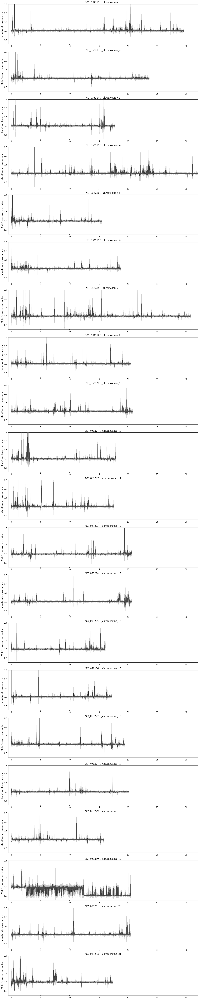

In [22]:
plot_data_out_Ga_Chr19_MFRatio = Plot_M_F_cov("%s/plot_data/Find_2n_windows/depths/M_over_F_depths_GaAutoX.out" % wd, 
                             outfilepath = "%s/plots/Finding_2n_windows/M_over_F_depth_ratio_GaAutoX.pdf" % wd,
                             scaffs = Ga_scaffs,
                             figlims = (20,5),    
                             roll = 10, 
                             plot_male = False, plot_female = False, plot_ratio = True,
                             male_points_color = "royalblue", male_fill_color = "dodgerblue" , male_line_color = "darkblue",
                             female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                             ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                             points_male = False, lines_male = True, fill_STD_male = True,
                             points_female = False, lines_female = True, fill_STD_female = True,
                             points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                             male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                             female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                             ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                             male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                             myXlims = (-0.5,32), myYlims_ax1 = (0.25,2.5), myYlims_ax2 = (-0.5,4), 
                             moving_average_offset = 2500, avg_window = None, features = None,
                             highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                             highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.05,
                             auto_average_male = None, auto_average_male_color = "blue", auto_average_male_alpha = 0.5, 
                             auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                             auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5,
                             vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)


##### zorder only works for M and F, not ratio 

Plotting scaffolds: NC_053212.1_chromosome_1, NC_053213.1_chromosome_2, NC_053214.1_chromosome_3, NC_053215.1_chromosome_4, NC_053216.1_chromosome_5, NC_053217.1_chromosome_6, NC_053218.1_chromosome_7, NC_053219.1_chromosome_8, NC_053220.1_chromosome_9, NC_053221.1_chromosome_10, NC_053222.1_chromosome_11, NC_053223.1_chromosome_12, NC_053224.1_chromosome_13, NC_053225.1_chromosome_14, NC_053226.1_chromosome_15, NC_053227.1_chromosome_16, NC_053228.1_chromosome_17, NC_053229.1_chromosome_18, NC_053230.1_chromosome_19, NC_053231.1_chromosome_20, NC_053232.1_chromosome_21


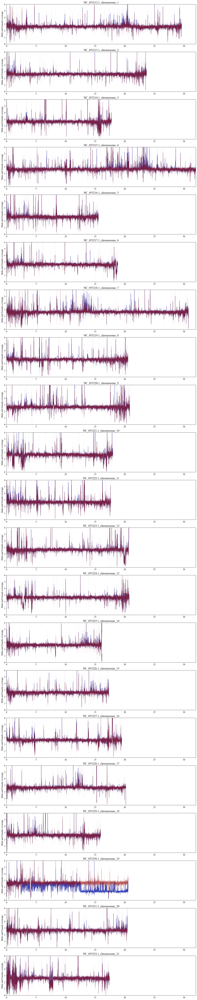

In [105]:
plot_data_out_Ga_XIX = Plot_M_F_cov("%s/plot_data/Find_2n_windows/depths/M_over_F_depths_GaAutoX.out" % wd,  
                                    outfilepath = "%s/plots/Finding_2n_windows/M_AND_F_depths_GaAutoX.pdf" % wd,
                                    scaffs = Ga_scaffs,
                                    figlims = (20,5),    
                                    roll = 10, 
                                    plot_male = True, plot_female = True, plot_ratio = False,
                                    male_points_color = "blue", male_fill_color = "royalblue" , male_line_color = "darkblue",
                                    female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                    ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                    points_male = False, lines_male = True, fill_STD_male = True,
                                    points_female = False, lines_female = True, fill_STD_female = True,
                                    points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                    male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                    female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                    ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                    male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                    myXlims = (0,32), myYlims_ax1 = (0,6), myYlims_ax2 = (-0.5,4), 
                                    moving_average_offset = 2500, avg_window = None, features = None,
                                    highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                                    highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.2,
                                    auto_average_male = None, auto_average_male_color = "black", auto_average_male_alpha = 0.5, 
                                    auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                    auto_average_ratio = None, auto_average_ratio_color = "black", auto_average_ratio_alpha = 0.5,
                                    vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)




Plotting scaffolds: NC_053230.1_chromosome_19


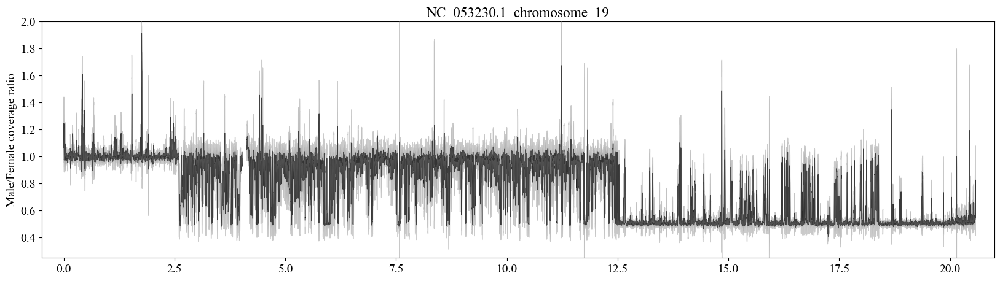

In [104]:
plot_data_out_Ga_Chr19_MFRatio = Plot_M_F_cov("%s/plot_data/Find_2n_windows/depths/M_over_F_depths_GaAutoX.out" % wd, 
                             outfilepath = "%s/plots/Finding_2n_windows/M_over_F_depth_ratio_GaX.pdf" % wd,
                             scaffs = [sex_chrom],
                             figlims = (20,5),    
                             roll = 10, 
                             plot_male = False, plot_female = False, plot_ratio = True,
                             male_points_color = "royalblue", male_fill_color = "dodgerblue" , male_line_color = "darkblue",
                             female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                             ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                             points_male = False, lines_male = True, fill_STD_male = True,
                             points_female = False, lines_female = True, fill_STD_female = True,
                             points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                             male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                             female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                             ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                             male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                             myXlims = (-0.5,21), myYlims_ax1 = (0.25,2), myYlims_ax2 = (-0.5,4), 
                             moving_average_offset = 2500, avg_window = None, features = None,
                             highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                             highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.05,
                             auto_average_male = None, auto_average_male_color = "blue", auto_average_male_alpha = 0.5, 
                             auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                             auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5,
                             vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)


##### zorder only works for M and F, not ratio 

The plotting function generates the datasets used below, so I need to plot all the stats (M, F, and M/F) even though this is not useful all on one plot. 

Plotting scaffolds: NC_053212.1_chromosome_1, NC_053213.1_chromosome_2, NC_053214.1_chromosome_3, NC_053215.1_chromosome_4, NC_053216.1_chromosome_5, NC_053217.1_chromosome_6, NC_053218.1_chromosome_7, NC_053219.1_chromosome_8, NC_053220.1_chromosome_9, NC_053221.1_chromosome_10, NC_053222.1_chromosome_11, NC_053223.1_chromosome_12, NC_053224.1_chromosome_13, NC_053225.1_chromosome_14, NC_053226.1_chromosome_15, NC_053227.1_chromosome_16, NC_053228.1_chromosome_17, NC_053229.1_chromosome_18, NC_053230.1_chromosome_19, NC_053231.1_chromosome_20, NC_053232.1_chromosome_21


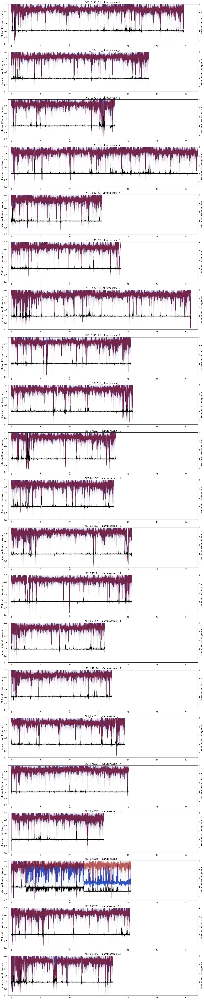

In [15]:
plot_data_out_Ga_AllScaffs_AllStats = Plot_M_F_cov("%s/plot_data/Find_2n_windows/depths/M_over_F_depths_GaAutoX.out" % wd, 
                             outfilepath = "%s/plot_data/Find_2n_windows/depths/M_over_F_depths_All_stats_GaAutoX.pdf" % wd,
                             scaffs = Ga_scaffs,
                             figlims = (20,5),    
                             roll = 10, 
                             plot_male = True, plot_female = True, plot_ratio = True,
                             male_points_color = "royalblue", male_fill_color = "dodgerblue" , male_line_color = "darkblue",
                             female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                             ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                             points_male = False, lines_male = True, fill_STD_male = True,
                             points_female = False, lines_female = True, fill_STD_female = True,
                             points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                             male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                             female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                             ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                             male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                             myXlims = (-0.5,32), myYlims_ax1 = (0,3), myYlims_ax2 = (-0.5,4), 
                             moving_average_offset = 2500, avg_window = None, features = None,
                             highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                             highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.05,
                             auto_average_male = None, auto_average_male_color = "blue", auto_average_male_alpha = 0.5, 
                             auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                             auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5,
                             vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)


##### zorder only works for M and F, not ratio 

## Identifying 1n and 2n windows

***Generate some stats for highlighting if needed***

In [16]:
high_windows_GaAutoX = highlight_windows(plot_data_out_Ga_AllScaffs_AllStats, 
                                         [sex_chrom],
                                         Nstdevs = 1, 
                                         n = 2, 
                                         window_size = 500)

Using 1 Stdevs around the mean

Finding highlight windows

Male:
  Mean = 2.65
  Stdev = 0.57
  Lower = 2.08
  Upper = 3.22

Female:
  Mean = 2.63
  Stdev = 0.54
  Lower = 2.09
  Upper = 3.17

Ratio:
  Mean = 1.01
  Stdev = 0.08
  Lower = 0.93
  Upper = 1.09
   15335 windows to highlight
   7.6675 Mb of genome highlighted


#### Heterozygosity <a id="GaX_Heterozygosity"></a>

Heterozygosity was caculated for males and females separately at all loci using VCFtools (--hardy)

#### Coverage vs Heterozygosity <a id="GaX_Cov_vs_Het"></a>

Now we will compare coverage and heterozygosity data. We need to match the two datasets. The coverage is in 0.5kb bins, whereas the heterozygosity is per variant. So we need to bin variants and calculate average heterozygosity per 0.5kb bin. The Combine_covs_hets() function does this. 

##### Histograms <a id="GaX_Cov_vs_Het_histograms"></a>
- Darkblue = autosomal mean
- Grey = loose cutoffs
- Black = tight cutoffs

In [19]:
Ga_AutoX_male_hets_path = "%s/plot_data/Find_2n_windows/VCF_stats/Filtered_BiAL_QUAL_GQ30_MinDP10_AF085_HARD_MALES.hwe" % wd

het_cov_dict, cov_dict, het_dict  = Combine_covs_hets(plot_data_out_Ga_AllScaffs_AllStats, 
                                                      Ga_AutoX_male_hets_path, 
                                                      window_size=500)

NC_053212.1_chromosome_1
NC_053213.1_chromosome_2
NC_053214.1_chromosome_3
NC_053215.1_chromosome_4
NC_053216.1_chromosome_5
NC_053217.1_chromosome_6
NC_053218.1_chromosome_7
NC_053219.1_chromosome_8
NC_053220.1_chromosome_9
NC_053221.1_chromosome_10
NC_053222.1_chromosome_11
NC_053223.1_chromosome_12
NC_053224.1_chromosome_13
NC_053225.1_chromosome_14
NC_053226.1_chromosome_15
NC_053227.1_chromosome_16
NC_053228.1_chromosome_17
NC_053229.1_chromosome_18
NC_053230.1_chromosome_19
NC_053231.1_chromosome_20
NC_053232.1_chromosome_21


I will plot some histograms first, to see how the two distributions look and to help make decisions on cutoffs later

In [22]:
## make the data for plotting (get heterozygosity means and track positions for the colours). 

Ga_AutoX_hets = []
Ga_AutoX_covs = []
Ga_AutoX_poss = [] ## for keeping track of positions

chrom = sex_chrom

for window in het_cov_dict[chrom]:
    if len(het_cov_dict[chrom][window]["hets"]) >= 1:
        Ga_AutoX_poss.append(window)
        Ga_AutoX_hets.append(np.mean(het_cov_dict[chrom][window]["hets"]))
        Ga_AutoX_covs.append(het_cov_dict[chrom][window]["M_F_cov"])
                     


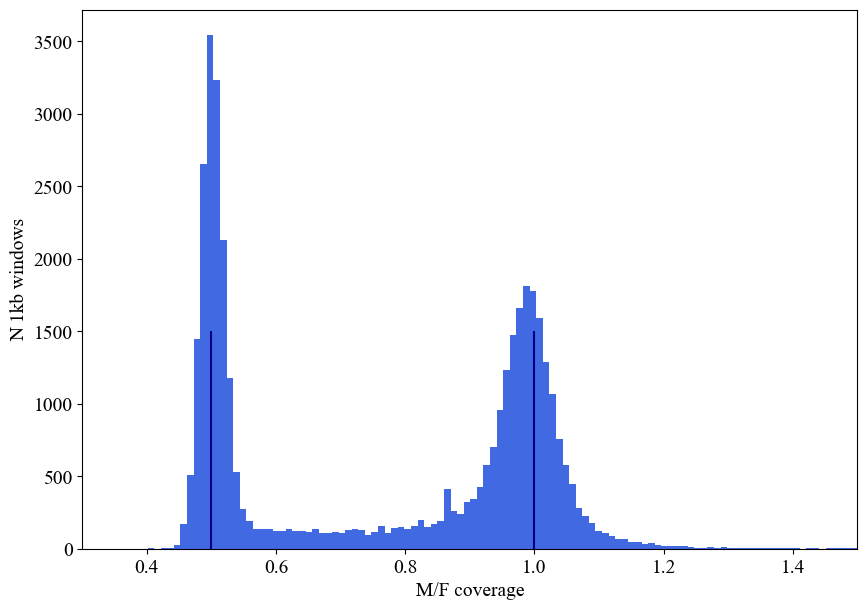

In [23]:
fig = plt.figure(figsize=(10,7))

plt.hist(Ga_AutoX_covs, bins = 250, align = 'mid', color = "royalblue")
plt.xlim(0.3,1.5)
plt.ylabel("N 1kb windows")
plt.xlabel("M/F coverage")

## plot autosomal mean

plt.vlines(1.0,0,1500, color = "darkblue")
plt.vlines(0.5,0,1500, color = "darkblue")

plt.savefig("/home/djeffrie/Data/Stickleback/G_aculeatus/FITNESS/plots/Finding_2n_windows/MF_cov_per_500bp_window.pdf")
plt.show()

In [24]:
## make the data for plotting (get heterozygosity means and track positions for the colours). 

Ga_AutoX_covs_hemi = []
Ga_AutoX_poss_hemi = [] ## for keeping track of positions

chrom = sex_chrom

for window in het_cov_dict[chrom]:
    if len(het_cov_dict[chrom][window]["hets"]) == 0:
        Ga_AutoX_poss_hemi.append(window)
        Ga_AutoX_covs_hemi.append(het_cov_dict[chrom][window]["M_F_cov"])
                     


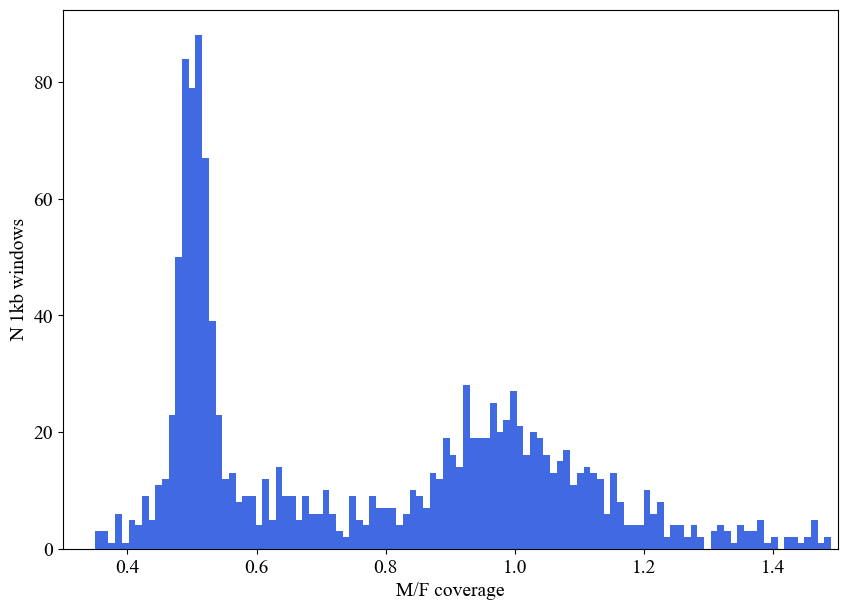

In [26]:
fig = plt.figure(figsize=(10,7))

plt.hist(Ga_AutoX_covs_hemi, bins = 250, align = 'mid', color = "royalblue")
plt.xlim(0.3,1.5)
plt.ylabel("N 1kb windows")
plt.xlabel("M/F coverage")

## plot autosomal mean

#plt.vlines(1.0,0,1500, color = "darkblue")
#plt.vlines(0.5,0,1500, color = "darkblue")

#plt.savefig("/home/djeffrie/Data/Stickleback/G_aculeatus/FITNESS/plots/Finding_2n_windows/MF_cov_per_500bp_window.pdf")
plt.show()

Yep, so there are some clearly hemizygous bins here. I think the best to do is to keep these aside and add them to the bins identified with cov vs het at the end. 

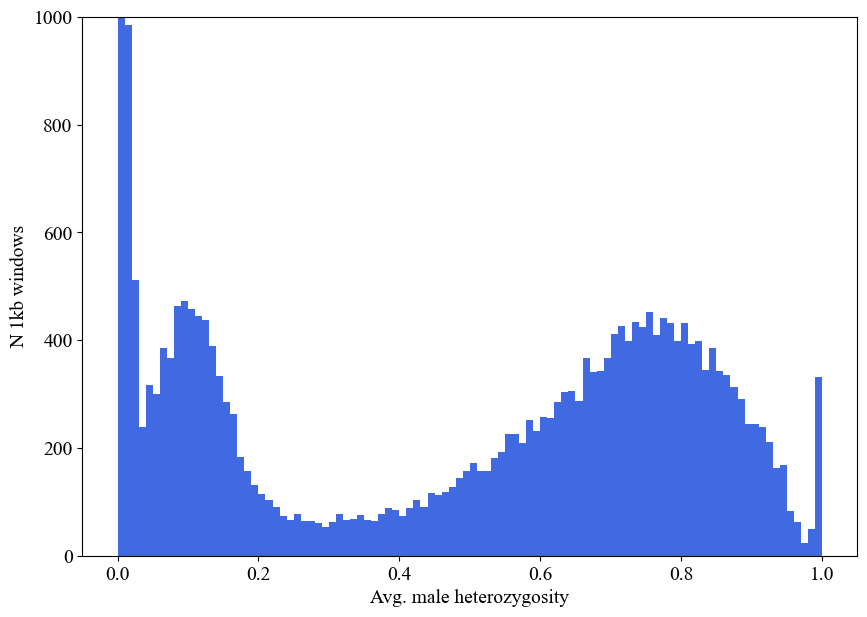

In [94]:
fig = plt.figure(figsize=(10,7))
plt.hist(Ga_AutoX_hets, bins = 100, color = "royalblue")
plt.ylim(0,1000)  ## note the 0 bar goes much higher

plt.ylabel("N 1kb windows")
plt.xlabel("Avg. male heterozygosity")

plt.savefig("/home/djeffrie/Data/Stickleback/G_aculeatus/FITNESS/plots/Finding_2n_windows/Male_het_per_500bp_window.pdf")
plt.show()

***Quick plot of distribution of heterozygostiy along the chromosome***

##### Coverage vs Heterozygosity scatter <a id="GaX_Cov_vs_Het_Scatter"></a>

The hope here is that the two will allow us to separate 2n and 1n windows.


/tmp/ipykernel_27430/3613109253.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([np.round(i,2) for i in np.linspace(0, max(poss), 9)])


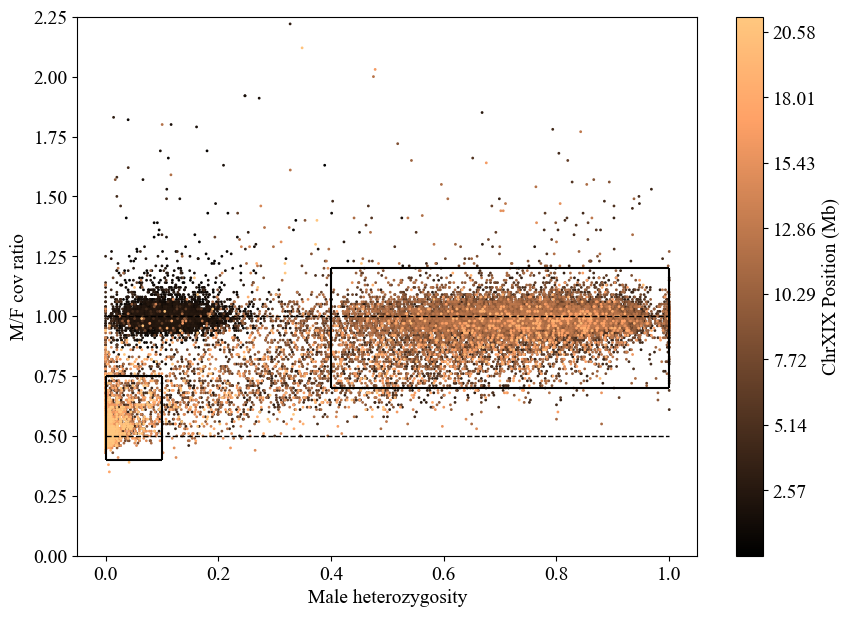

In [28]:
## plotting

## 2n windows
het_lower_2n = 0.4
het_upper_2n = 1.0
cov_lower_2n = 0.7
cov_upper_2n = 1.2

## 1n windows
het_lower_1n = 0
het_upper_1n = 0.1
cov_lower_1n = 0.4
cov_upper_1n = 0.75


plot = Plot_cov_het_scatter(Ga_AutoX_hets, 
                     Ga_AutoX_covs, 
                     Ga_AutoX_poss,
                     rects = [[het_lower_2n, het_upper_2n, cov_lower_2n, cov_upper_2n], 
                              [het_lower_1n, het_upper_1n, cov_lower_1n, cov_upper_1n]],
                     rect_cols = ["black", "black"])

The combination of the two is indeed helpful. I have included some strict and loose filters with which we pulled out putative 2n bins. 

In [99]:
plot.savefig("%s/plots/Finding_2n_windows/MF_cov_vs_Male_het_per_500bp_window.pdf" % wd)

### Isolating putatively 2n bins <a id="GaX_2n_Bins"></a>

We need to decide on which windows to assign as 1n or 2n. This requires setting some thresholds, but where to set these? Do we use the loose or the strict thresholds above? Ultimately we are always going to have windows with 2n and 1n regions. Even if we used 500 bins. There are some bits of info we need to decide this. . . 

- How many windows kept with the different filtering strategies?
- How do the distribution of windows along the chromosome fit our expectation based on the strata?

So I will check these things below. 

#### Loose threshold 2n bin positions <a id="GaX_2n_Bins_loose_thresh"></a>

In [29]:
het_lower_2n = 0.4
het_upper_2n = 1.0
cov_lower_2n = 0.7
cov_upper_2n = 1.2

In [30]:
## Make a list of the 2n windows to keep with loose thresholds, and visualise on the genome. 

_2n_windows = []
_2n_windows_dict = {}
_2n_windows_dict[sex_chrom] = {}
_2n_windows_dict[sex_chrom]["CENTRE"] = []
_2n_windows_dict[sex_chrom]["M_over_F_Cov_ratio"] = []

for window in het_cov_dict[sex_chrom]:
    if len(het_cov_dict[sex_chrom][window]['hets']) >= 1:
        if all([0.7 <= het_cov_dict[sex_chrom][window]['M_F_cov'] <= 1.2,
                0.4 <= np.mean(het_cov_dict[sex_chrom][window]['hets']) <= 1.0]):
            
            _2n_windows.append(window)
            _2n_windows_dict[sex_chrom]["CENTRE"].append(window)
            _2n_windows_dict[sex_chrom]["M_over_F_Cov_ratio"].append(het_cov_dict[sex_chrom][window]['M_F_cov'])
                
print(len(_2n_windows))



15167


Plotting scaffolds: NC_053230.1_chromosome_19


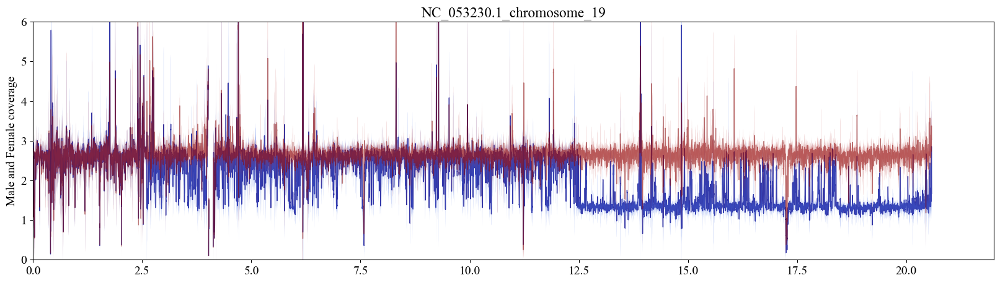

In [102]:
plot_data_out_Ga_XIX = Plot_M_F_cov("%s/plot_data/Find_2n_windows/depths/M_over_F_depths_GaAutoX.out" % wd,  
                                    outfilepath = "%s/plots/Finding_2n_windows/M_AND_F_depths_GaX.pdf" % wd,
                                    scaffs = [sex_chrom],
                                    figlims = (20,5),    
                                    roll = 10, 
                                    plot_male = True, plot_female = True, plot_ratio = False,
                                    male_points_color = "blue", male_fill_color = "royalblue" , male_line_color = "darkblue",
                                    female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                    ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                    points_male = False, lines_male = True, fill_STD_male = True,
                                    points_female = False, lines_female = True, fill_STD_female = True,
                                    points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                    male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                    female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                    ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                    male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                    myXlims = (0,22), myYlims_ax1 = (0,6), myYlims_ax2 = (-0.5,4), 
                                    moving_average_offset = 2500, avg_window = None, features = None,
                                    highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                                    highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.2,
                                    auto_average_male = None, auto_average_male_color = "black", auto_average_male_alpha = 0.5, 
                                    auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                    auto_average_ratio = None, auto_average_ratio_color = "black", auto_average_ratio_alpha = 0.5,
                                    vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)




Plotting scaffolds: NC_053230.1_chromosome_19


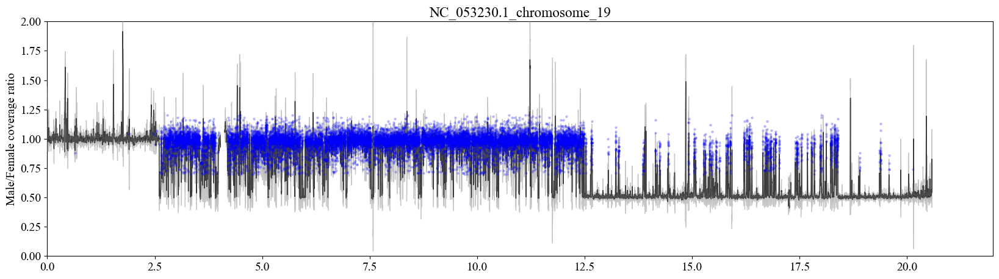

In [103]:
plot_data_out_Ga_XIX = Plot_M_F_cov("%s/plot_data/Find_2n_windows/depths/M_over_F_depths_GaAutoX.out" % wd,  
                                    outfilepath = "%s/plots/Finding_2n_windows/M_vs_F_depths_GaX_2n_windows.pdf" % wd,
                                    scaffs = [sex_chrom],
                                    figlims = (20,5),    
                                    roll = 10, 
                                    plot_male = False, plot_female = False, plot_ratio = True,
                                    male_points_color = "blue", male_fill_color = "royalblue" , male_line_color = "darkblue",
                                    female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                    ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                    points_male = False, lines_male = True, fill_STD_male = True,
                                    points_female = False, lines_female = True, fill_STD_female = True,
                                    points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                    male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                    female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                    ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                    male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                    myXlims = (0,22), myYlims_ax1 = (0,2), myYlims_ax2 = (-0.5,4), 
                                    moving_average_offset = 2500, avg_window = None, features = None,
                                    highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                                    highlight_2n_windows_ratio = _2n_windows_dict, highlight_2n_color = "blue", highlight_2n_alpha = 0.2,
                                    auto_average_male = None, auto_average_male_color = "black", auto_average_male_alpha = 0.5, 
                                    auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                    auto_average_ratio = None, auto_average_ratio_color = "black", auto_average_ratio_alpha = 0.5,
                                    vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)




##### Outputting loose threshold bins <a id="GaX_2n_Bins_loose_out"></a>

In [104]:
with open("%s/results/2n_windows.bed" % wd, 'w') as _2n_windows_out:

    for window in _2n_windows:

        start = int((window-0.00025)*1000000)
        stop = int((window+0.00025)*1000000)

        _2n_windows_out.write("%s\t%s\t%s\n" % (sex_chrom,start, stop))

    

#### Loose threshold 1n bin positions <a id="GaX_1n_Bins_loose_thresh"></a>

In [ ]:
## 1n windows
het_lower_1n = 0
het_upper_1n = 0.1
cov_lower_1n = 0.4
cov_upper_1n = 0.75

In [32]:
_1n_windows = []
_1n_windows_dict = {}
_1n_windows_dict[sex_chrom] = {}
_1n_windows_dict[sex_chrom]["CENTRE"] = []
_1n_windows_dict[sex_chrom]["M_over_F_Cov_ratio"] = []

for window in het_cov_dict[sex_chrom]:
    if len(het_cov_dict[sex_chrom][window]['hets']) >= 1:
        
        if all([0.4 <= het_cov_dict[sex_chrom][window]['M_F_cov'] <= 0.75,
            0 <= np.mean(het_cov_dict[sex_chrom][window]['hets']) <= 0.1]):
            
            _1n_windows.append(window)
            _1n_windows_dict[sex_chrom]["CENTRE"].append(window)
            _1n_windows_dict[sex_chrom]["M_over_F_Cov_ratio"].append(het_cov_dict[sex_chrom][window]['M_F_cov'])
                
print(len(_1n_windows))


16894


Plotting scaffolds: NC_053230.1_chromosome_19


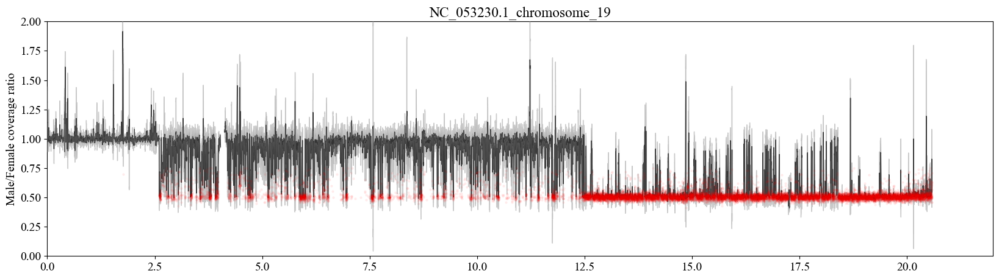

In [106]:
plot_data_out_Ga_XIX = Plot_M_F_cov("%s/plot_data/Find_2n_windows/depths/M_over_F_depths_GaAutoX.out" % wd, 
                             outfilepath = "%s/plots/Finding_2n_windows/M_vs_F_depths_GaX_1n_windows.pdf" % wd,
                             scaffs = [sex_chrom],
                             figlims = (20,5),    
                             roll = 10, 
                             plot_male = False, plot_female = False, plot_ratio = True,
                             male_points_color = "blue", male_fill_color = "royalblue" , male_line_color = "darkblue",
                             female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                             ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                             points_male = False, lines_male = True, fill_STD_male = True,
                             points_female = False, lines_female = True, fill_STD_female = True,
                             points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                             male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                             female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                             ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                             male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                             myXlims = (0,22), myYlims_ax1 = (0,2), myYlims_ax2 = (-0.5,4), 
                             moving_average_offset = 2500, avg_window = None, features = None,
                             highlight_1n_windows_ratio = _1n_windows_dict, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                             highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.2,
                             auto_average_male = None, auto_average_male_color = "blue", auto_average_male_alpha = 0.5, 
                             auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                             auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5,
                             vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)




##### Outputting 1n windows <a id="GaX_1n_windows_out"></a>

***Adding in the hemizygous windows with no variants here***

In [35]:
with open("%s/results/1n_windows.bed" % wd, 'w') as _1n_windows_out:

    for window in _1n_windows:

        start = int((window-0.00025)*1000000)
        stop = int((window+0.00025)*1000000)

        _1n_windows_out.write("%s\t%s\t%s\n" % (sex_chrom,start, stop))

    for window in Ga_AutoX_poss_hemi:

        start = int((window-0.00025)*1000000)
        stop = int((window+0.00025)*1000000)

        _1n_windows_out.write("%s\t%s\t%s\n" % (sex_chrom,start, stop))
    

##### Plotting both 1n and 2n windows <a id="GaX_1n_and_2n_windows"></a>

Plotting scaffolds: NC_053230.1_chromosome_19


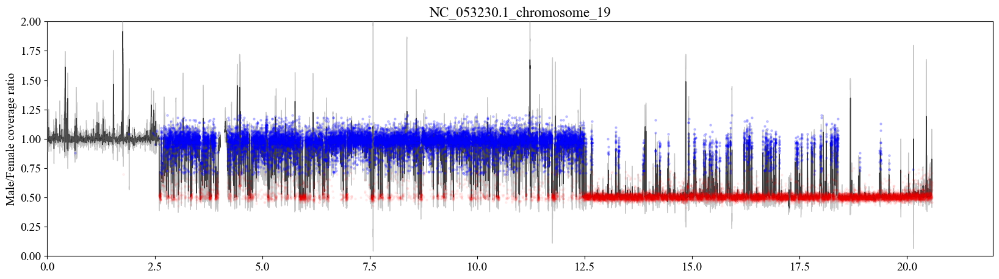

In [40]:
plot_data_out_Ga_XIX = Plot_M_F_cov("%s/plot_data/Find_2n_windows/depths/M_over_F_depths_GaAutoX.out" % wd, 
                             outfilepath = "%s/plots/Finding_2n_windows/M_vs_F_depths_GaX_1n_and_2n_windows.pdf" % wd,
                             scaffs = [sex_chrom],
                             figlims = (20,5),    
                             roll = 10, 
                             plot_male = False, plot_female = False, plot_ratio = True,
                             male_points_color = "blue", male_fill_color = "royalblue" , male_line_color = "darkblue",
                             female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                             ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                             points_male = False, lines_male = True, fill_STD_male = True,
                             points_female = False, lines_female = True, fill_STD_female = True,
                             points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                             male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                             female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                             ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                             male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                             myXlims = (0,22), myYlims_ax1 = (0,2), myYlims_ax2 = (-0.5,4), 
                             moving_average_offset = 2500, avg_window = None, features = None,
                             highlight_1n_windows_ratio = _1n_windows_dict, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                             highlight_2n_windows_ratio = _2n_windows_dict, highlight_2n_color = "blue", highlight_2n_alpha = 0.2,
                             auto_average_male = None, auto_average_male_color = "blue", auto_average_male_alpha = 0.5, 
                             auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                             auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5,
                             vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)




# EXTRA

## Chr11 inversion  <a id="Ga_chr11_inversion"></a>

In the process of this analysis found an intriguing pattern on Chr11. There is a difference in coverage between males and females at, what I think is, the known chr11 inversion. I think this could be evidence of a sex bias in the genotypes at this inversion. . . . Its not relevant to the sex chromosome project, but cool nonetheless. 

Note - this first plot was done in preliminary analyses with populations PS and LW

Plotting scaffolds: chrXI


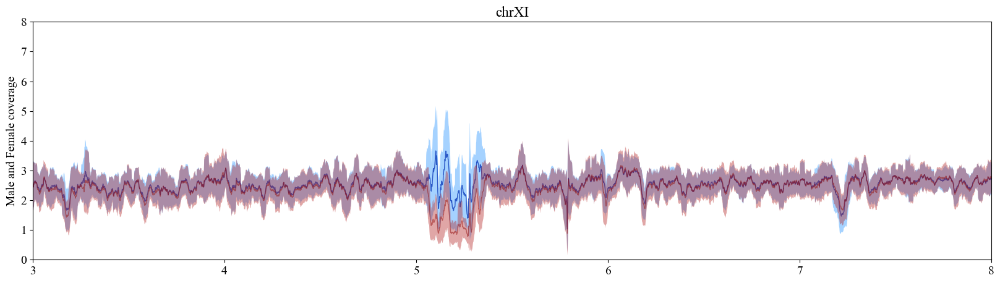

In [ ]:
plot_data_out_Ga = Plot_M_F_cov("/Users/dj20y461/Data_temp/Stickleback/Y_comp/2n_windows/Ga/Autos_X/depths/M_over_F_depths_GaAutoX.out", 
                             scaffs = ["chrXI"],
                             figlims = (20,5),    
                             roll = 50, 
                             plot_male = True, plot_female = True, plot_ratio = False,
                             male_points_color = "royalblue", male_fill_color = "dodgerblue" , male_line_color = "darkblue",
                             female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                             ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                             points_male = False, lines_male = True, fill_STD_male = True,
                             points_female = False, lines_female = True, fill_STD_female = True,
                             points_ratio = False, lines_ratio = True, fill_STD_ratio = False,
                             male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                             female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                             ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                             male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                             myXlims = (3,8), myYlims_ax1 = (0,8), myYlims_ax2 = (-0.5,4), 
                             moving_average_offset = 2500, avg_window = None, features = None,
                             highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                             highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.05,
                             auto_average_male = None, auto_average_male_color = "blue", auto_average_male_alpha = 0.5, 
                             auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                             auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5,
                             vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)


##### zorder only works for M and F, not ratio 

This one was done with the FITNESS data. THe signal is still somewhat there 

Plotting scaffolds: NC_053222.1_chromosome_11


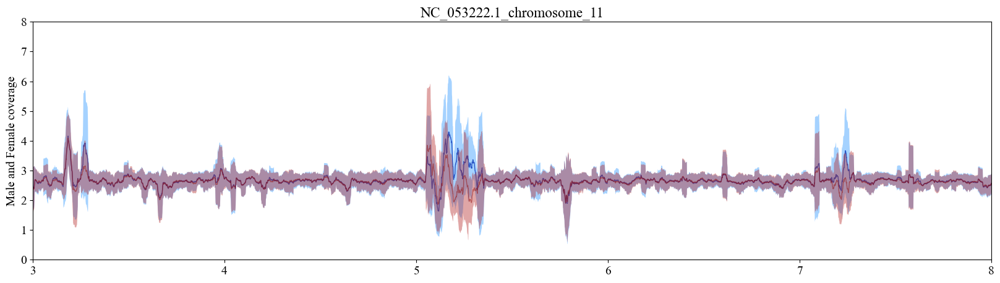

In [136]:
plot_data_out_Ga_XIX = Plot_M_F_cov("%s/plot_data/Find_2n_windows/depths/M_over_F_depths_GaAutoX.out" % wd, 
                             outfilepath = "%s/plots/Finding_2n_windows/M_vs_F_depths_GaX_1n_and_2n_windows.pdf" % wd,
                             scaffs = ['NC_053222.1_chromosome_11'],
                             figlims = (20,5),    
                             roll = 50, 
                             plot_male = True, plot_female = True, plot_ratio = False,
                             male_points_color = "royalblue", male_fill_color = "dodgerblue" , male_line_color = "darkblue",
                             female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                             ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                             points_male = False, lines_male = True, fill_STD_male = True,
                             points_female = False, lines_female = True, fill_STD_female = True,
                             points_ratio = False, lines_ratio = True, fill_STD_ratio = False,
                             male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                             female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                             ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                             male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                             myXlims = (3,8), myYlims_ax1 = (0,8), myYlims_ax2 = (-0.5,4), 
                             moving_average_offset = 2500, avg_window = None, features = None,
                             highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                             highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.05,
                             auto_average_male = None, auto_average_male_color = "blue", auto_average_male_alpha = 0.5, 
                             auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                             auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5,
                             vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)

